# OCR Project 1 - Searching for specific terms

# Installing Tesseract

In [1]:
# !sudo apt install tesseract-ocr
# !pip install pytesseract

In [2]:
# !mkdir tessdata
# !wget -O ./tessdata/por.traineddata https://github.com/tesseract-ocr/tessdata/blob/main/por.traineddata?raw=true

# Importing the libraries

In [4]:
import pytesseract
from pytesseract import Output
import numpy as np
import cv2
import os
import re
import matplotlib.pyplot as plt
from PIL import ImageFont, ImageDraw, Image

# Connecting to Google Drive and visualizing the images

In [17]:
directory_imgs = "Images/Images Project 1"
paths = [os.path.join(directory_imgs, f) for f in os.listdir(directory_imgs)]
print(paths)

['Images/Images Project 1/referencias_artigo.jpg', 'Images/Images Project 1/prefacio_tanenbaum.jpg', 'Images/Images Project 1/artigo_introducao_vc.jpg', 'Images/Images Project 1/receita02.jpg', 'Images/Images Project 1/ebook_sistemasoperacionais.jpg', 'Images/Images Project 1/informacao_nutricional.jpg', 'Images/Images Project 1/caixa-refrigerador.jpg']


In [18]:
def show_img(img):
  fig = plt.gcf()
  fig.set_size_inches(20, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

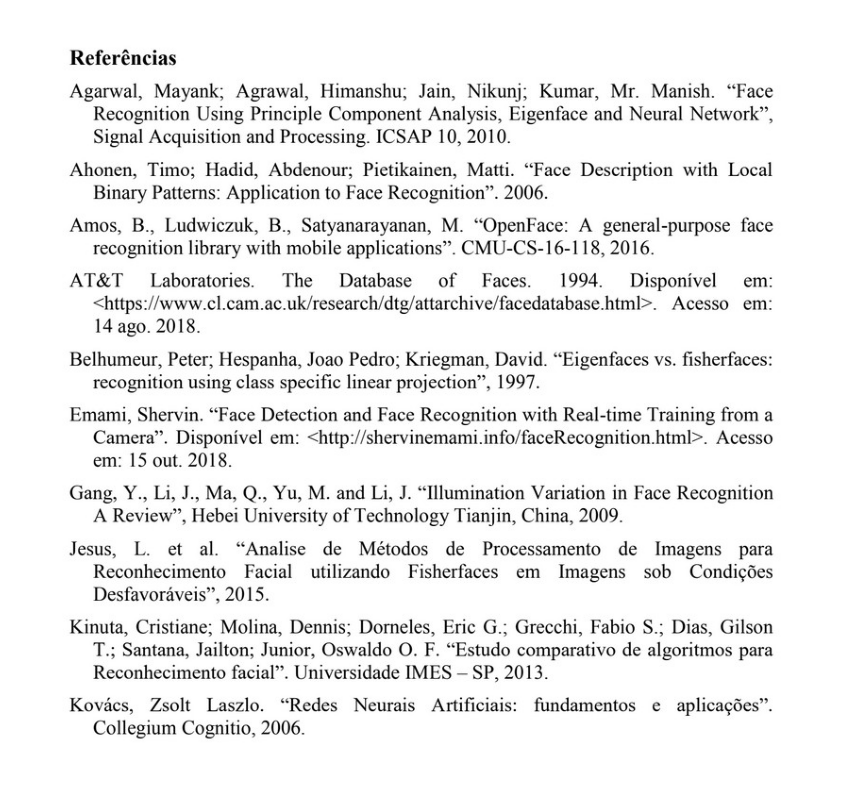

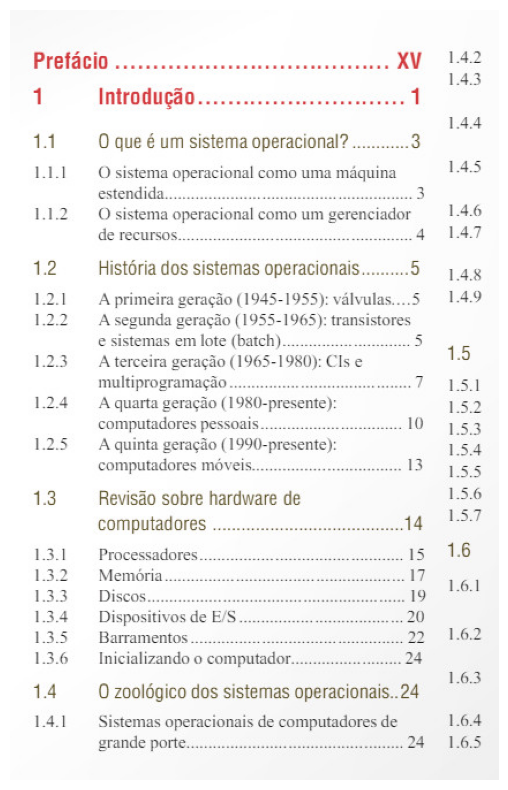

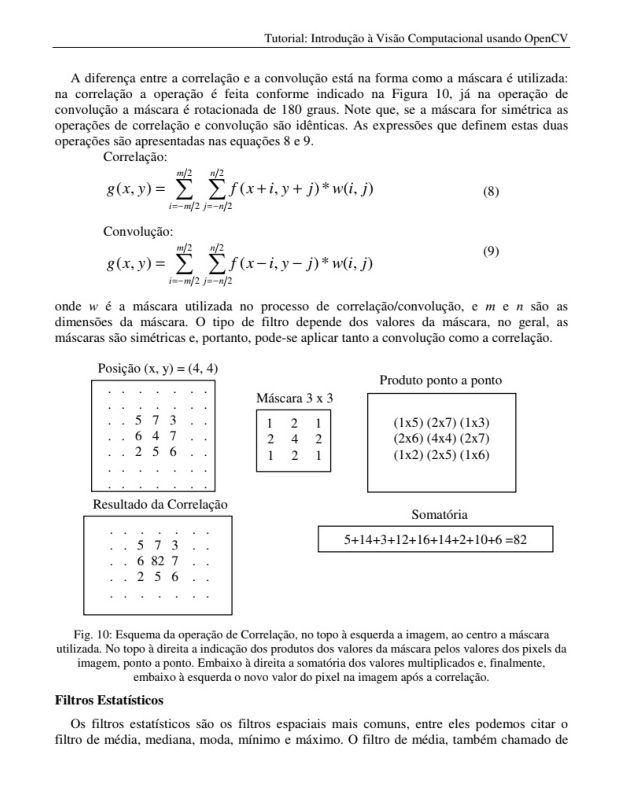

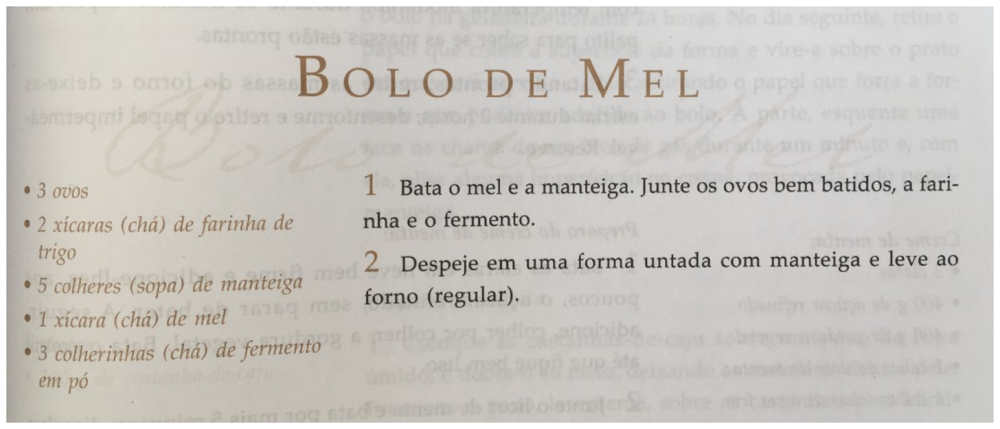

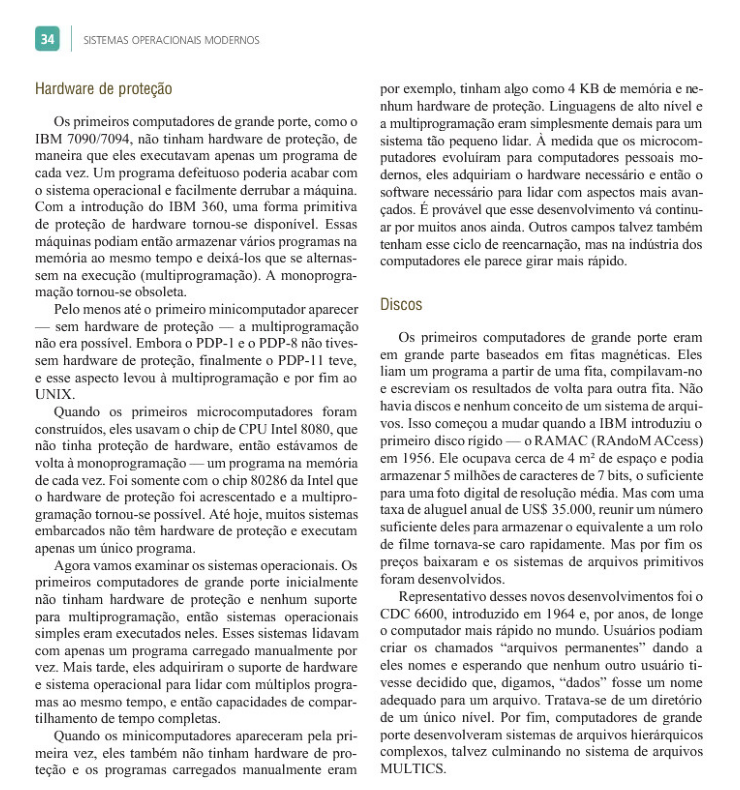

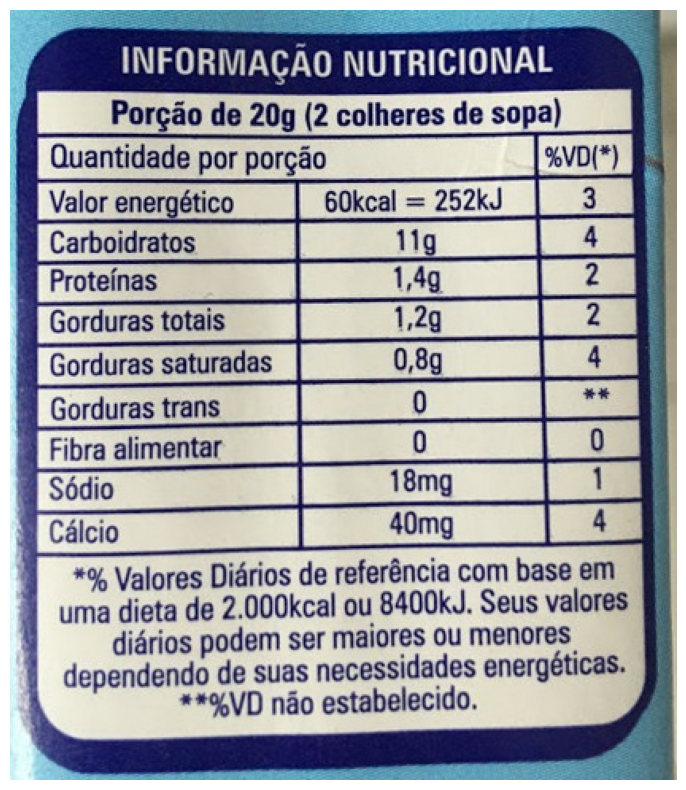

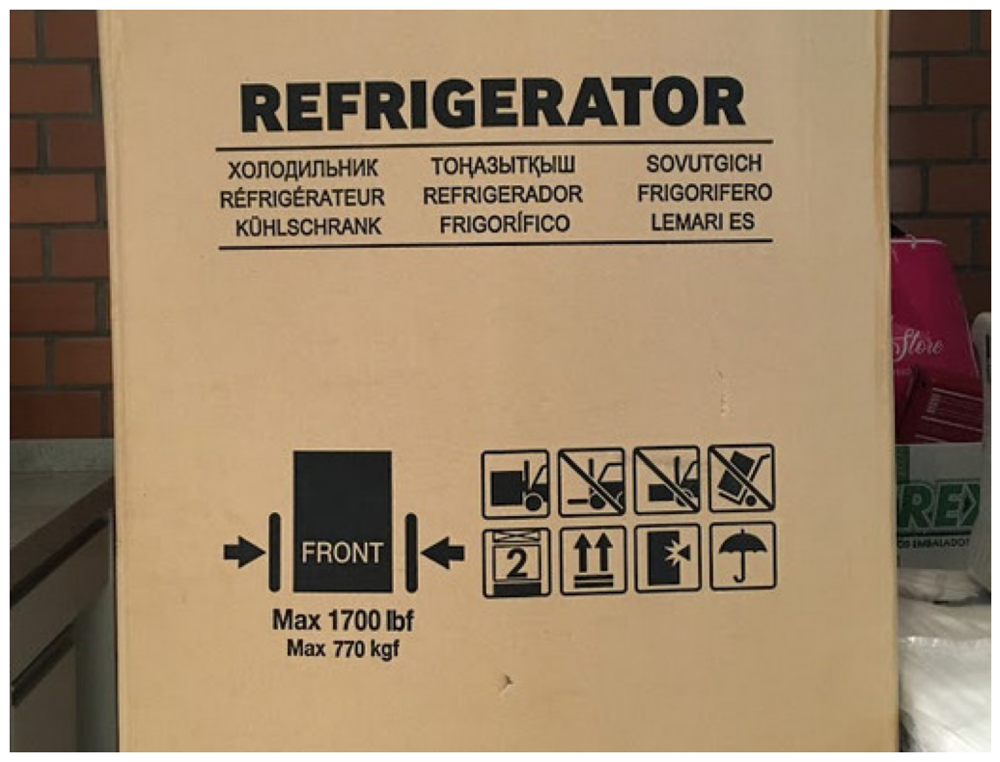

In [19]:
for image in paths:
  image = cv2.imread(image)
  show_img(image)

# Tesseract settings

In [20]:
config_tesseract = "--tessdata-dir tessdata"

In [21]:
def tesseract_ocr(img, config_tesseract):
  text = pytesseract.image_to_string(img, lang='por', config=config_tesseract)
  return text

# Text recognition

In [22]:
full_text = ''
txt_file = 'results_ocr.txt'

In [23]:
for image in paths:
  #print(image)
  img = cv2.imread(image)
  file_image = os.path.split(image)[-1]
  #print(file_image)
  file_image_separate = '================\n' + str(file_image)
  #print(file_image_separate)
  full_text = full_text + file_image_separate + '\n'

  text = tesseract_ocr(img, config_tesseract)
  #print(text)
  full_text = full_text + text

In [25]:
print(full_text)

referencias_artigo.jpg
Referências

Agarwal, Mayank; Agrawal, Himanshu; Jain, Nikunj; Kumar, Mr. Manish. “Face
Recognition Using Principle Component Analysis, Eigenface and Neural Network”,
Signal Acquisition and Processing. ICSAP 10, 2010.

Ahonen, Timo; Hadid, Abdenour; Pietikainen, Matti. “Face Description with Local
Binary Patterns: Application to Face Recognition”. 2006.

Amos, B., Ludwiczuk, B., Satyanarayanan, M. “OpenFace: A general-purpose face
recognition library with mobile applications”. CMU-CS-16-118,2016.

AT&T  Laboratoriess. The Database of Faces. 1994 Disponível em:
<https://www.cl.cam.ac.uk/research/dtg/attarchive/facedatabase.html>. Acesso em:
14 ago. 2018.

Belhumeur, Peter; Hespanha, Joao Pedro; Kriegman, David. “Eigenfaces vs. fisherfaces:
recognition using class specific linear projection”, 1997.

Emami, Shervin. “Face Detection and Face Recognition with Real-time Training from a
Camera”. Disponível em: <http://shervinemami.info/faceRecognition.html>. Acesso
em: 

## Saving the results

In [26]:
file_txt = open(txt_file, 'w+')
file_txt.write(full_text + '\n')
file_txt.close()

## Searching in the .txt file

In [27]:
term_search = 'computador' # computer

In [28]:
with open('results_ocr.txt') as f:
  results = [i.start() for i in re.finditer(term_search, f.read())]

In [29]:
results

[2149,
 2209,
 2260,
 2371,
 2455,
 4662,
 5221,
 5480,
 5956,
 6408,
 6778,
 7078,
 7143,
 8001,
 8283]

In [30]:
len(results)

15

## Searching in the images

In [32]:
for image in paths:
  #print(image)
  img = cv2.imread(image)
  file_img = os.path.split(image)[-1]
  print('==================\n' + str(file_img))
  text = tesseract_ocr(img, config_tesseract)
  results = [i.start() for i in re.finditer(term_search, text)]
  print(f"Number of times the term {term_search} appears: {len(results)}")
  print('\n')

referencias_artigo.jpg
Number of times the term computador appears: 0


prefacio_tanenbaum.jpg
Number of times the term computador appears: 5


artigo_introducao_vc.jpg
Number of times the term computador appears: 0


receita02.jpg
Number of times the term computador appears: 0


ebook_sistemasoperacionais.jpg
Number of times the term computador appears: 10


informacao_nutricional.jpg
Number of times the term computador appears: 0


caixa-refrigerador.jpg
Number of times the term computador appears: 0




## Word cloud

In [34]:
# https://spacy.io
import spacy

> Update in 2023: for more recent spacy versions, now it's necessary to change the name of the package, from:
  * `pt` to `pt_core_news_sm`
  * `en` to `en_core_web_sm`

> This change is required in the *download command* below and also in the `spacy.load()` parameter

In [35]:
!python -m spacy download pt_core_news_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 10.5 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_sm')


In [36]:
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 11.3 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [37]:
nlp_en = spacy.load('en_core_web_sm')

In [38]:
print(spacy.lang.en.stop_words.STOP_WORDS)

{'themselves', 'along', 'still', 'us', 'somewhere', 'do', 'ourselves', 'are', 'ca', 'ours', 'yet', 'take', 'side', 'if', "n't", 'both', 'somehow', 'used', 'that', 'always', 'becomes', '’s', 'does', 'get', 'same', '‘ve', 'have', 'indeed', 'mostly', 'not', 'two', 'anyhow', 'between', 'my', 'please', 'whole', 'then', 'these', 'therefore', 'hereupon', 'toward', 'has', 'above', 'would', 'yourselves', 'across', 'elsewhere', 'may', 'it', 'whereupon', 'too', 'thence', 'first', 'again', 'you', 'be', 'at', 'which', "'s", 'might', 'regarding', "'d", 'less', 'her', 'someone', 'this', 'seeming', 'however', 'whereafter', 'no', 'already', 'them', 'whenever', 'former', 'though', 'fifteen', 'anyway', 'below', 'neither', 'moreover', 'nor', 'she', 'why', 'whom', 'whereby', 'since', 'most', 'six', 'third', 'behind', 'never', 'i', 'sometimes', 'keep', 'seem', 'can', "'ve", 'sometime', 'nothing', 'could', 'although', '‘ll', 'hereby', 'itself', 'than', 'there', 'latter', 'nine', 'amongst', 'next', 'thru', 'm

In [39]:
len(spacy.lang.en.stop_words.STOP_WORDS)

326

In [40]:
nlp = spacy.load('pt_core_news_sm')

In [41]:
stop_words = spacy.lang.pt.stop_words.STOP_WORDS
print(stop_words)

{'quanto', 'somente', 'nossos', 'da', 'estou', 'nossa', 'disso', 'do', 'local', 'segundo', 'ver', 'cento', 'adeus', 'meus', 'quais', 'nós', 'seis', 'nunca', 'alguns', 'dez', 'oitavo', 'tentaram', 'todas', 'cuja', 'estivemos', 'terceiro', 'cujo', 'próxima', 'quinto', 'num', 'breve', 'ontem', 'direita', 'se', 'máximo', 'estás', 'tiveram', 'daquela', 'final', 'número', 'meses', 'nosso', 'ir', 'assim', 'baixo', 'tendes', 'parece', 'nova', 'outras', 'isso', 'deste', 'possivelmente', 'tentar', 'seria', 'dizer', 'puderam', 'vinda', 'querem', 'ou', 'isto', 'lhe', 'pontos', 'por', 'quatro', 'na', 'temos', 'ser', 'tu', 'deverá', 'cada', 'quarto', 'ademais', 'vão', 'iniciar', 'cá', 'cinco', 'eles', 'sétimo', 'comprida', 'faz', 'possível', 'tivestes', 'dezoito', 'mil', 'umas', 'até', 'uma', 'bastante', 'foste', 'tal', 'conselho', 'nesta', 'novo', 'outra', 'tivemos', 'quando', 'longe', 'porém', 'de', 'vinte', 'dá', 'apoia', 'ora', 'quieta', 'parte', 'minhas', 'para', 'povo', 'aquela', 'custa', 'est

In [42]:
len(stop_words)

416

In [43]:
def preprocessing(text):
  text = text.lower()

  document = nlp(text)
  tokens_list = []
  for token in document:
    #print(token)
    tokens_list.append(token.text)
  #print(tokens_list)

  tokens = [word for word in tokens_list if word not in stop_words]
  #print(tokens)
  tokens = ' '.join([str(element) for element in tokens])
  #print(tokens)
  return tokens

In [44]:
preprocessing('Note que, se a máscara for simétrica as operações de correlação')

'note , máscara simétrica operações correlação'

In [45]:
processed_full_text = preprocessing(full_text)

In [46]:
len(full_text), len(processed_full_text)

(9077, 8081)

In [47]:
9586 - 8944

642

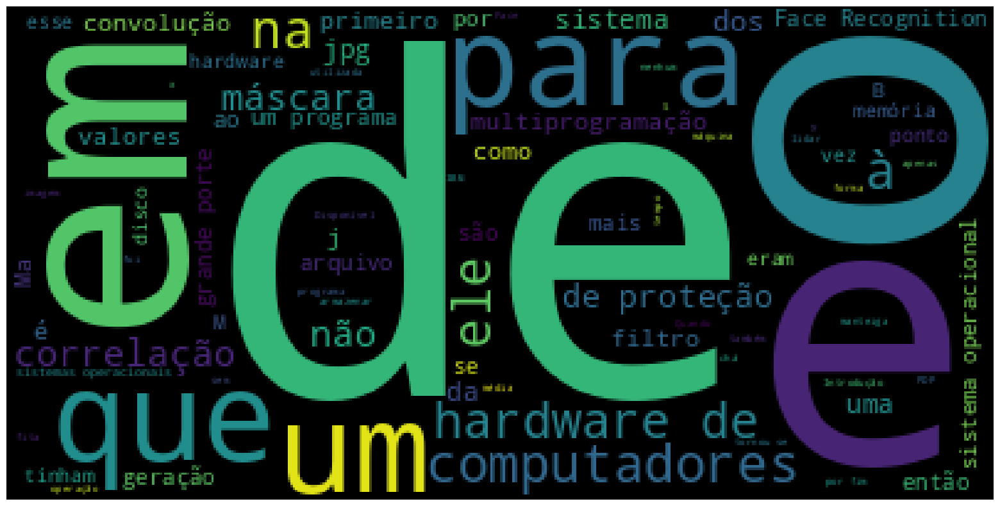

In [53]:
# from wordcloud import WordCloud
# plt.figure(figsize=(20,10))
# plt.imshow(WordCloud().generate(full_text)); # of, what, the -> stopwords


from wordcloud import WordCloud
import numpy as np
import matplotlib.pyplot as plt

# Generate the word cloud
wc = WordCloud().generate(full_text)

# Convert to array manually to bypass the bug
cloud_array = np.array(wc.to_image())

plt.figure(figsize=(20,10))
plt.imshow(cloud_array)
plt.axis("off") # Optional: hides the axis numbers
plt.show()


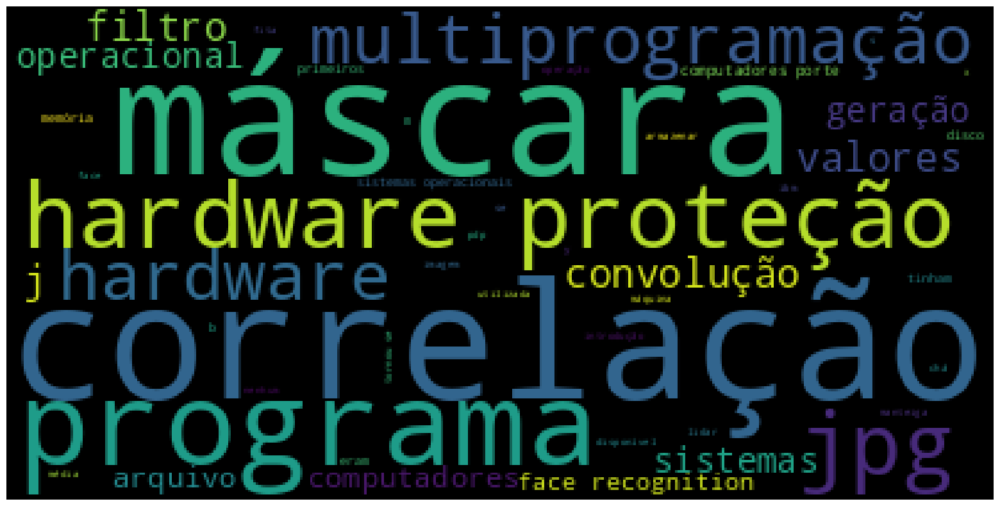

In [55]:
# from wordcloud import WordCloud
# plt.figure(figsize=(20,10))
# plt.imshow(WordCloud().generate(processed_full_text));

from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np

# 1. Generate the cloud
wc = WordCloud().generate(processed_full_text)

# 2. Fix: Manually convert to a PIL image then to a numpy array
# This avoids the internal WordCloud.__array__ call that causes the crash
wc_array = np.array(wc.to_image())

# 3. Plot the converted array
plt.figure(figsize=(20,10))
plt.imshow(wc_array)
plt.axis("off")
plt.show()


## Named entity recognition

- Documentation: https://spacy.io/api/annotation#named-entities

In [56]:
document = nlp(processed_full_text)

In [57]:
from spacy import displacy
displacy.render(document, style = 'ent', jupyter = True)

In [58]:
for entity in document.ents:
  if entity.label_ == 'PER':
    print(entity.text, entity.label_)

referencias_artigo.jpg PER
nikunj PER
manish PER
icsap 10 PER
matti PER
b. PER
satyanarayanan PER
recognition PER
peter PER
hespanha PER
joao pedro PER
kriegman PER
david PER
j. “ illumination variation PER
jesus PER
l. et al PER
eric g. PER
fabio s. PER
gilson PER
oswaldo PER
kovács PER
y)= 2 PER
m2 PER
pdp-1 PER
— frigorifero PER


# Text recognition in the images

## Function to write in the images

In [59]:
font = 'Fonts/calibri.ttf'

In [60]:
def write_text(text, x, y, img, font, color=(50, 50, 255), font_size=16):
  font = ImageFont.truetype(font, font_size)
  img_pil = Image.fromarray(img)
  draw = ImageDraw.Draw(img_pil)
  draw.text((x, y-font_size), text, font = font, fill = color)
  img = np.array(img_pil)

  return img

## Function to show the detections

In [61]:
min_conf = 30

In [62]:
def box(i, result, img, color=(255, 100, 0)):
  x = result["left"][i]
  y = result["top"][i]
  w = result["width"][i]
  h = result["height"][i]

  cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)

  return x, y, img

In [63]:
# computer - Computer

In [64]:
def ocr_process_image(img, term_search, config_tesseract, min_conf):
  result = pytesseract.image_to_data(img, config=config_tesseract, lang='por', output_type=Output.DICT)
  number_of_times = 0
  for i in range(0, len(result['text'])):
    confidence = int(result['conf'][i])
    if confidence > min_conf:
      text = result['text'][i]
      if term_search.lower() in text.lower():
        x, y, img = box(i, result, img, (0,0,255))
        img = write_text(text, x, y, img, font, (50,50,225), 14)
        number_of_times += 1
  return img, number_of_times

## Searching for specific terms

referencias_artigo.jpg
Number of times term computador appears in referencias_artigo.jpg: 0




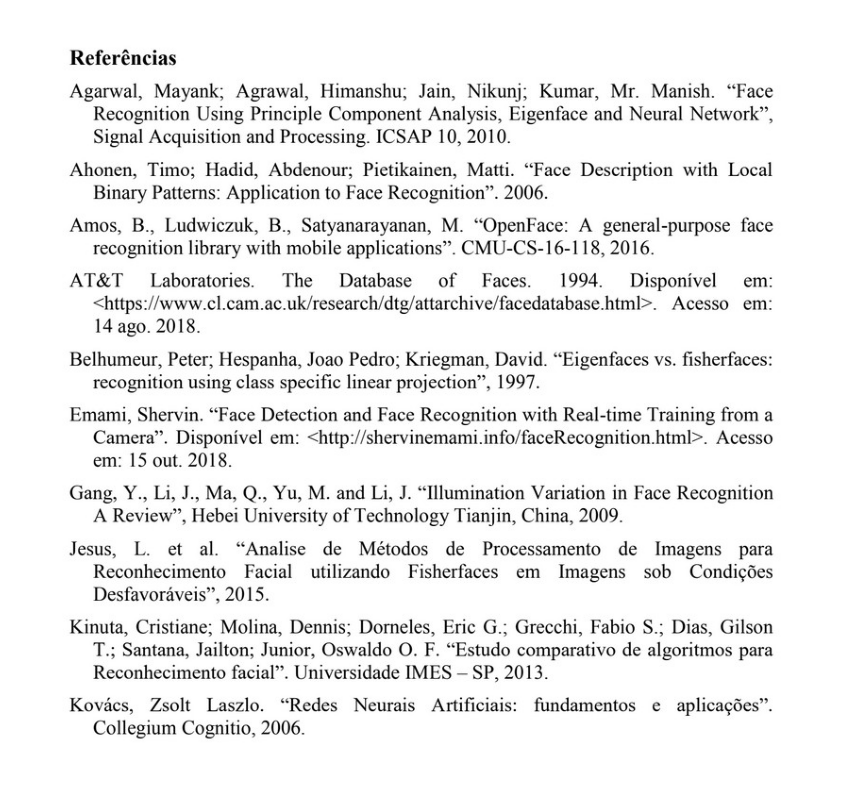

prefacio_tanenbaum.jpg
Number of times term computador appears in prefacio_tanenbaum.jpg: 5




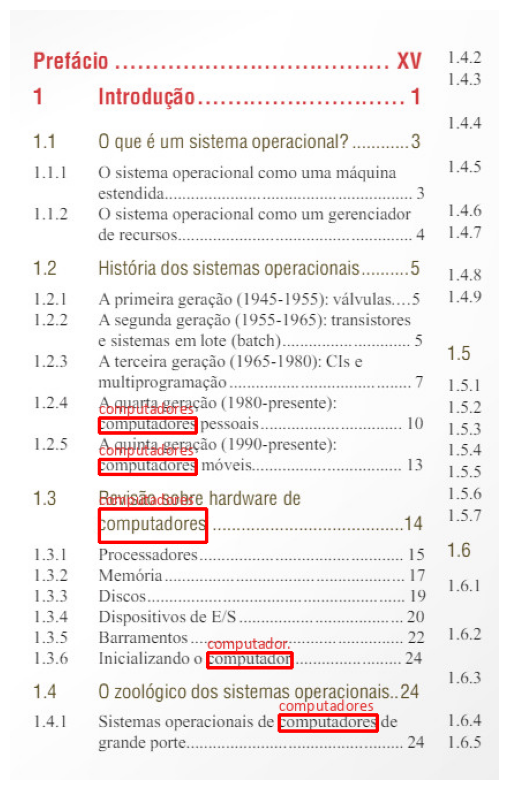

artigo_introducao_vc.jpg
Number of times term computador appears in artigo_introducao_vc.jpg: 0




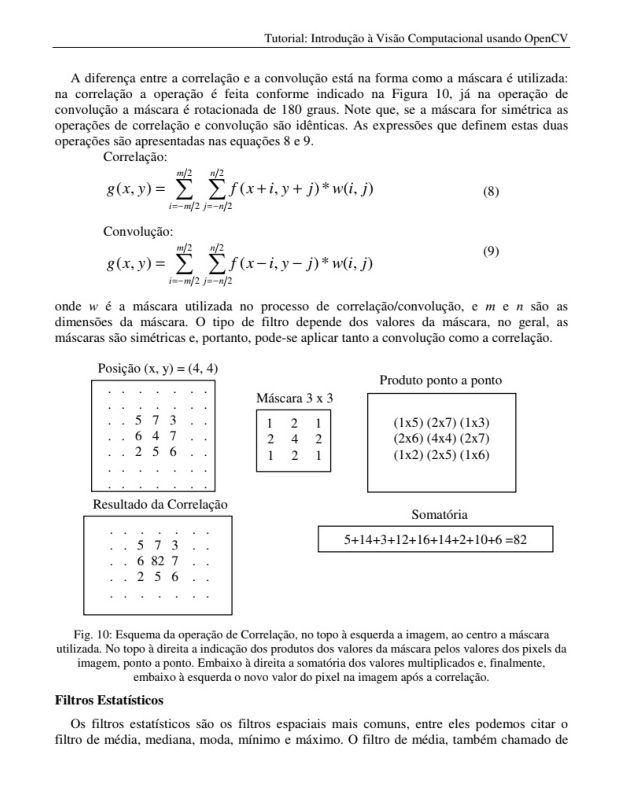

receita02.jpg
Number of times term computador appears in receita02.jpg: 0




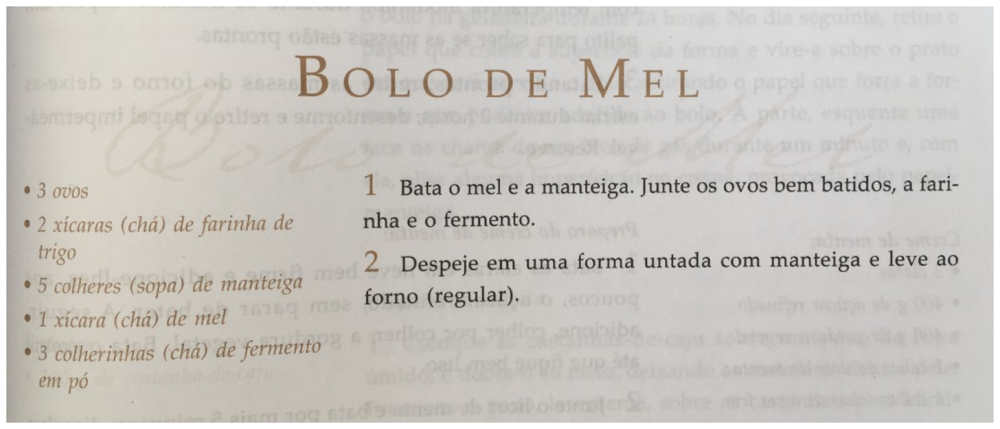

ebook_sistemasoperacionais.jpg
Number of times term computador appears in ebook_sistemasoperacionais.jpg: 10




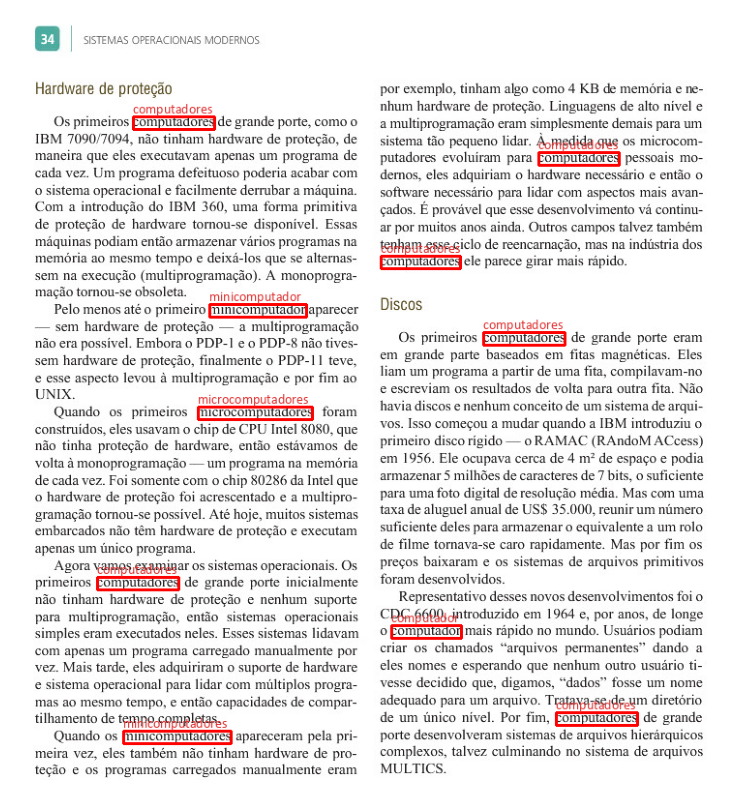

informacao_nutricional.jpg
Number of times term computador appears in informacao_nutricional.jpg: 0




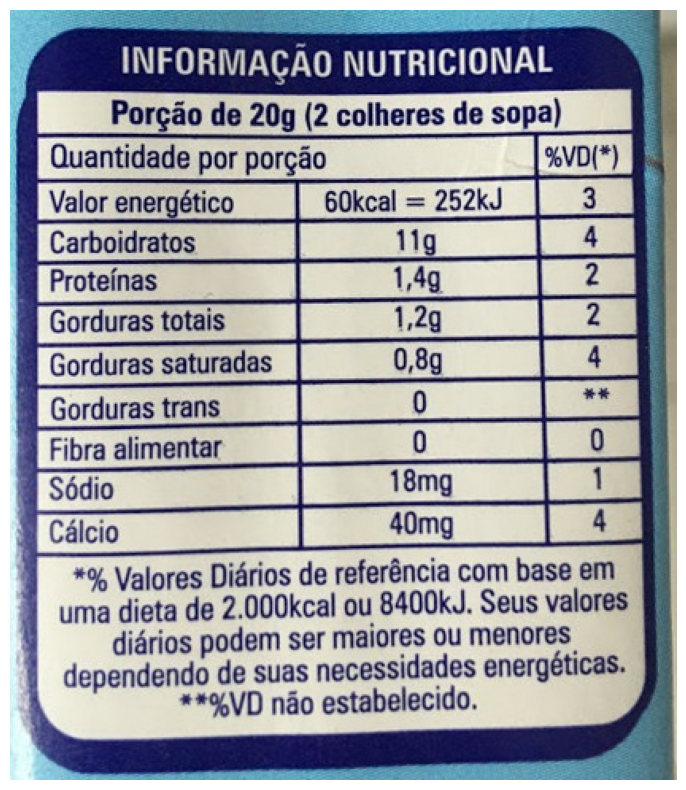

caixa-refrigerador.jpg
Number of times term computador appears in caixa-refrigerador.jpg: 0




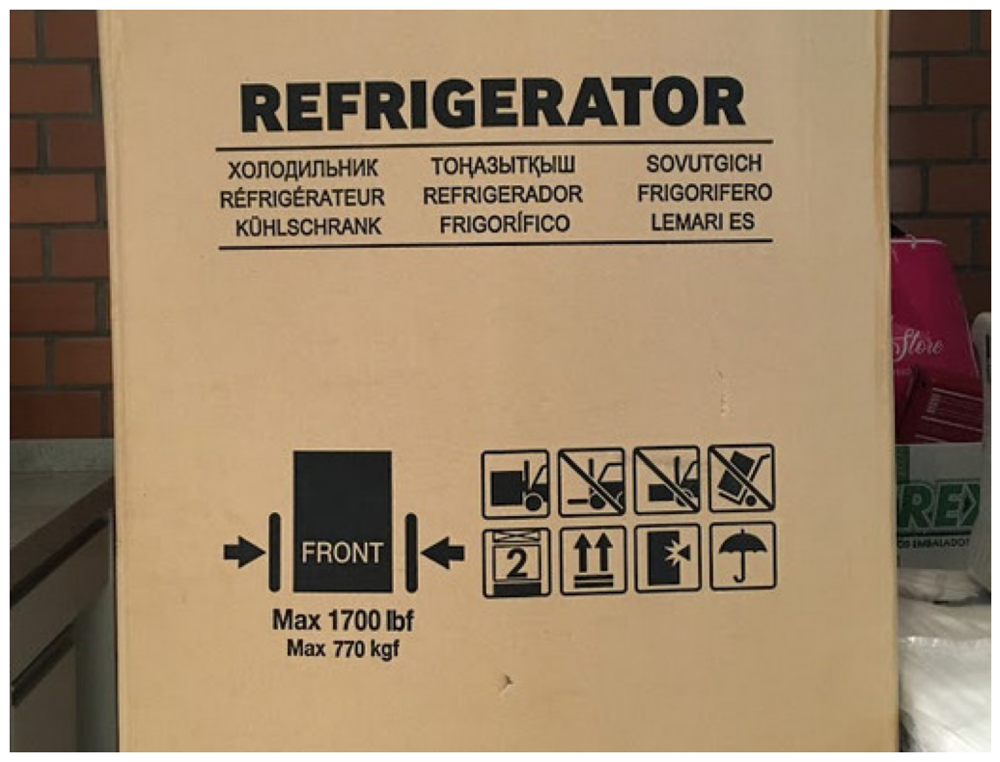

In [69]:
term_search = 'computador' # computer
for image in paths:
  #print(image)
  img = cv2.imread(image)
  img_original = img.copy()
  file_image = os.path.split(image)[-1]
  print('=================\n' + str(file_image))

  img, number_of_times = ocr_process_image(img, term_search, config_tesseract, min_conf)
  print(f'Number of times term {term_search} appears in {file_image}: {number_of_times}')
  print('\n')
  show_img(img)

## Saving the results

In [66]:
term_search = 'sopa' # soup

In [67]:
os.makedirs('processed_images', exist_ok = True)

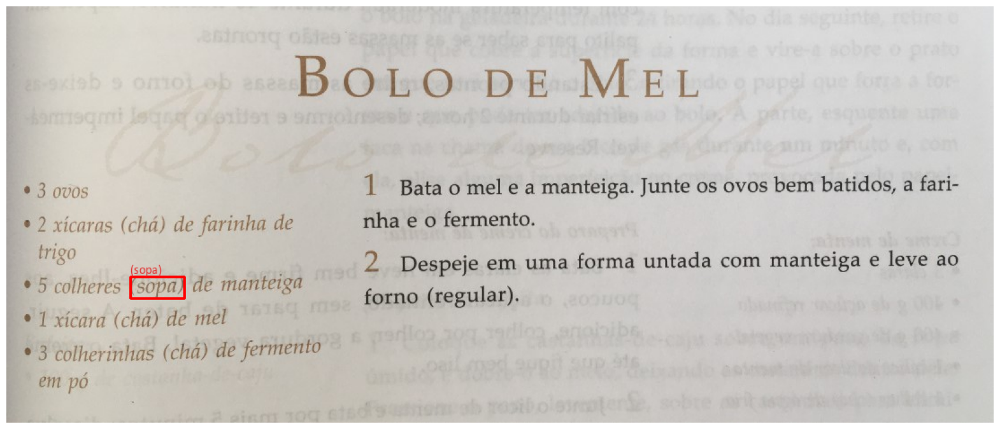

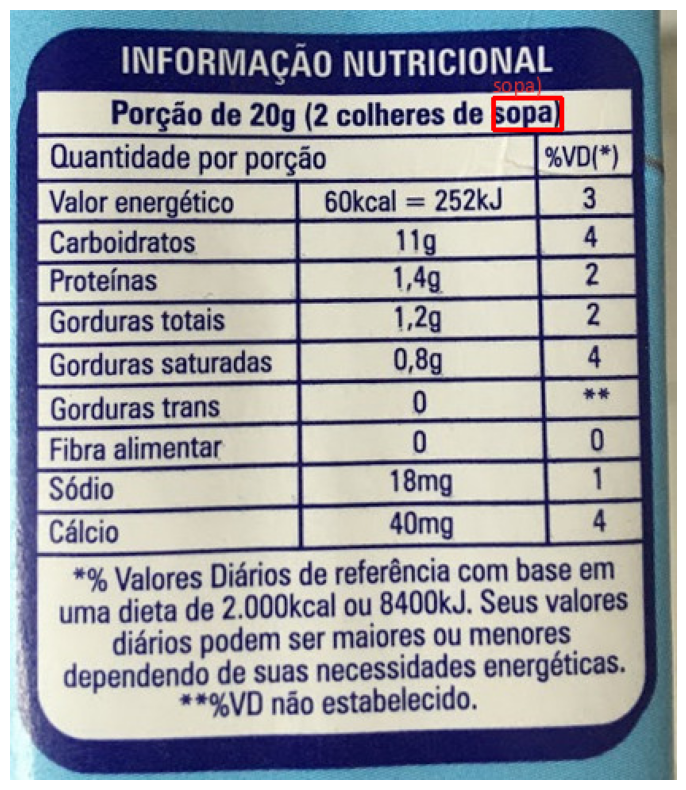

In [68]:
for image in paths:
  #print(image)
  img = cv2.imread(image)
  img_original = img.copy()
  file_image = os.path.split(image)[-1]
  img, number_of_times = ocr_process_image(img, term_search, config_tesseract, min_conf)
  if number_of_times > 0:
    show_img(img)
    new_file_image = 'processed_' + file_image
    new_image = '/content/processed_images/' + str(new_file_image)
    cv2.imwrite(new_image, img)